In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas
import numpy as np
from sklearn import tree
import sklearn.linear_model as lm
from sklearn import preprocessing, model_selection, pipeline
from sklearn import metrics
from sklearn.inspection import permutation_importance



from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets



import sys
sys.path.append('C://Program Files//Graphviz//bin')



np.set_printoptions(precision=3)
pandas.set_option("display.precision", 3)


%matplotlib inline

# Classificacao

# Regressão Logística 

## Vinhos


### Leitura da Base 

In [2]:
df_wine = pandas.read_csv('../Data/dataset_vinhos.csv',sep=';')


wine_target_col = 'target'

wine_label_map = df_wine[['target', 'target_label']].drop_duplicates()

drop_cols = ['target_label']
df_wine.drop(drop_cols, axis=1, inplace=True)
print(df_wine.shape)
df_wine.head()

(5320, 13)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.998,3.51,0.56,9.4,0,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.997,3.20,0.68,9.8,0,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.997,3.26,0.65,9.8,0,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.998,3.16,0.58,9.8,1,red
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.998,3.51,0.56,9.4,0,red


### Transformação Variáveis Categóricas

In [3]:
categorical_cols = ['type']
encoder_map = {}

for cname in categorical_cols:
    encoder = preprocessing.OneHotEncoder(sparse=False)
    transformed = encoder.fit_transform(df_wine[[cname]])
    ohe_df = pandas.DataFrame(transformed, columns=[cname+'_'+cat for cat in encoder.categories_[0]])
    encoder_map[cname] = encoder
    
    df_wine = pandas.concat([df_wine, ohe_df], axis=1).drop(cname, axis=1)
df_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target,type_red,type_white
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.998,3.51,0.56,9.4,0,1.0,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.997,3.20,0.68,9.8,0,1.0,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.997,3.26,0.65,9.8,0,1.0,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.998,3.16,0.58,9.8,1,1.0,0.0
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.998,3.51,0.56,9.4,0,1.0,0.0


### Treinamento Regressão Logística 

In [4]:

Y = df_wine[wine_target_col]
X = df_wine.drop(wine_target_col, axis=1)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[wine_target_col] = ytrain
df_test[wine_target_col] = ytest

# Pipeline
model_wine = pipeline.Pipeline([
                                ('scaler', preprocessing.StandardScaler()),
#                                 ('scaler', preprocessing.MinMaxScaler()),
                                ('model', lm.LogisticRegression(penalty='l2',
                                                                solver='liblinear'))
                               ]) 

model_wine.fit(xtrain, ytrain)      
df_train['decision_lr'] = model_wine.predict(xtrain)
df_test['decision_lr']  = model_wine.predict(xtest)
df_train['probability_lr'] = model_wine.predict_proba(xtrain)[:,1]
df_test['probability_lr']  = model_wine.predict_proba(xtest)[:,1]

df_wine_lr = pandas.concat((df_train, df_test), axis=0)


idx = df_wine_lr['train_set'] == 0

print('Logistic\t', metrics.accuracy_score(df_wine_lr[idx][wine_target_col],
                                           df_wine_lr[idx]['probability_lr']>0.5))

Logistic	 0.7368421052631579


### Coeficientes da Regressão Logística

In [5]:
def plot_coefs(model, class_label, target_label_map):
    fig = plt.figure(figsize=(15,4))
    
    iclass = 0
    if class_label != '':
        idx  = target_label_map.target_label==class_label
        iclass = target_label_map.loc[idx, 'target'].values[0]
    
    if len(model.coef_.shape) == 2:
        coefs = model.coef_[iclass]
    else:
        coefs = model.coef_
        
    coef_names = xtrain.columns

    idx = np.argsort(coefs)

    plt.bar(np.arange(coefs.shape[0]), coefs[idx])
    plt.xticks(np.arange(coefs.shape[0]), coef_names[idx], rotation='90')
    plt.title('Coeficientes do modelo ' + model.__class__.__name__ + ' ' + class_label)
    plt.grid()
    plt.xlim((-0.5, coefs.shape[0]-0.5))
    plt.show()
    
    
interact(plot_coefs, model = fixed(model_wine.steps[1][1]), 
         class_label = fixed(''),
         target_label_map = fixed(wine_label_map))

interactive(children=(Output(),), _dom_classes=('widget-interact',))

<function __main__.plot_coefs(model, class_label, target_label_map)>

### Estimativa dos Parâmetros 

In [6]:
from statsmodels.discrete import discrete_model

logit = discrete_model.Logit(ytrain, xtrain).fit()

logit.summary()

Optimization terminated successfully.
         Current function value: 0.509517
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 target   No. Observations:                 4256
Model:                          Logit   Df Residuals:                     4243
Method:                           MLE   Df Model:                           12
Date:                Mon, 14 Feb 2022   Pseudo R-squ.:                  0.2301
Time:                        20:48:22   Log-Likelihood:                -2168.5
converged:                       True   LL-Null:                       -2816.6
Covariance Type:            nonrobust   LLR p-value:                3.190e-270
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
fixed acidity            0.1009      0.067      1.506      0.132      -0.030       0.232
volatile acidity        -4.7204      0.368    -12.820      0.000      -5.442      -3.999
citric acid              0.3441      0.321      1.071      0.284      -0.286       0.974
residual sugar           0.1048      0.025      4.151      0.000       0.055       0.154
chlorides               -2.5046      1.290     -1.941      0.052      -5.034       0.025
free sulfur dioxide      0.0160      0.003      5.029      0.000       0.010       0.022
total sulfur dioxide    -0.0055      0.001     -4.246      0.000      -0.008      -0.003
density               -168.0897     64.157     -2.620      0.009    -293.834     -42.345
pH                       1.3800      0.382      3.616      0.000       0.632       2.128
sulphates                2.2450      0.336      6.688      0.000       1.587       2.903
alcohol                  0.7661      0.083      9.176      0.000       0.602       0.930
type_red               155.3308     63.304      2.454      0.014      31.257     279.405
type_white             154.5077     63.170      2.446      0.014      30.697     278.319
========================================================================================
"""

## Íris 

In [7]:
df_iris = pandas.read_csv('../Data/dataset_iris.csv',sep=';')

iris_label_map = df_iris[['target', 'target_label']].drop_duplicates()

drop_cols = ['target_label']
df_iris.drop(drop_cols, axis=1, inplace=True)

print(df_iris.shape)

iris_target_col = 'target'


df_iris.head()

(150, 5)


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


### Treinamento 

In [8]:

Y = df_iris[iris_target_col]
X = df_iris.drop(iris_target_col, axis=1)
iris_feature_names = list(X.columns)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[iris_target_col] = ytrain
df_test[iris_target_col] = ytest


model_iris = pipeline.Pipeline([
                                ('scaler', preprocessing.StandardScaler()),
#                                 ('scaler', preprocessing.MinMaxScaler()),
                                ('model', lm.LogisticRegression(penalty='l1',
                                                                solver='liblinear'))
                               ]) 
model_iris.fit(xtrain, ytrain)      
df_train['decision_lr'] = model_iris.predict(xtrain)
df_test['decision_lr']  = model_iris.predict(xtest)
for icls in iris_label_map.target.unique():
    xclass = xtrain[ytrain==icls]
    idx = df_train[iris_target_col] == icls
    df_train.loc[idx,'probability_lr'] = model_iris.predict_proba(xclass)[:,icls]
    xclass = xtest[ytest==icls]
    idx = df_test[iris_target_col] == icls
    df_test.loc[idx,'probability_lr']  = model_iris.predict_proba(xclass)[:,icls]

df_iris_lr = pandas.concat((df_train, df_test), axis=0)

idx = df_iris_lr['train_set'] == 0

print('Logistic\t', metrics.accuracy_score(df_iris_lr[idx][iris_target_col],
                                           df_iris_lr[idx]['decision_lr']))

Logistic	 0.9666666666666667


### Intercept Parameter

In [9]:
i=50
print('==== EXAMPLE ====')
X = df_iris[iris_feature_names].iloc[i]
print(X)
print('Classe:', df_iris.merge(iris_label_map, on='target')['target_label'].iloc[i])
print('==== SCALER ====')
print(model_iris.steps[0][1].mean_)
print(model_iris.steps[0][1].scale_)
print('==== PARAMETERS ====')
print(model_iris.steps[1][1].coef_)
print(model_iris.steps[1][1].intercept_)

# Setosa
Xnorm = (X - model_iris.steps[0][1].mean_) / model_iris.steps[0][1].scale_
likelihood = model_iris.steps[1][1].intercept_[0] + np.dot(model_iris.steps[1][1].coef_[0],
                                                           Xnorm.values)
Psetosa = 1/(1+np.exp(-likelihood))

print("==== P(x=setosa) ====")
print("=>", Psetosa)

# Versicolor
likelihood = model_iris.steps[1][1].intercept_[1] + np.dot(model_iris.steps[1][1].coef_[1],
                                                           Xnorm.values)
Pversicolor = 1/(1+np.exp(-likelihood))

print("==== P(x=versicolor) ====")
print("=>", Pversicolor)


# Virginica
likelihood = model_iris.steps[1][1].intercept_[2] + np.dot(model_iris.steps[1][1].coef_[2],
                                                           Xnorm.values)
Pvirginica = 1/(1+np.exp(-likelihood))

print("==== P(x=virginica) ====")
print("=>", Pvirginica)


==== EXAMPLE ====
sepal length (cm)    7.0
sepal width (cm)     3.2
petal length (cm)    4.7
petal width (cm)     1.4
Name: 50, dtype: float64
Classe: versicolor
==== SCALER ====
[5.833 3.039 3.753 1.195]
[0.82  0.422 1.761 0.762]
==== PARAMETERS ====
[[ 0.     1.052 -4.158 -0.07 ]
 [ 0.293 -1.261  0.    -0.217]
 [ 0.    -0.316  2.499  3.951]]
[-1.78  -0.856 -4.002]
==== P(x=setosa) ====
=> 0.025740558577852398
==== P(x=versicolor) ====
=> 0.2734277509359171
==== P(x=virginica) ====
=> 0.15238586232915208


### Coeficientes da Regressão 

In [10]:
interact(plot_coefs, model = fixed(model_iris.steps[1][1]), 
         class_label = iris_label_map.target_label,
         target_label_map = fixed(iris_label_map))


interactive(children=(Dropdown(description='class_label', options=('setosa', 'versicolor', 'virginica'), value…

<function __main__.plot_coefs(model, class_label, target_label_map)>

# Árvore Classificação 

## Vinhos 

In [11]:

Y = df_wine[wine_target_col]
X = df_wine.drop(wine_target_col, axis=1)
wine_feature_names = list(X.columns)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[wine_target_col] = ytrain
df_test[wine_target_col] = ytest


model_wine = tree.DecisionTreeClassifier(criterion='entropy', max_depth = 4)
model_wine.fit(xtrain, ytrain)      
df_train['decision_tr'] = model_wine.predict(xtrain)
df_test['decision_tr']  = model_wine.predict(xtest)
df_train['probability_tr'] = model_wine.predict_proba(xtrain)[:,1]
df_test['probability_tr']  = model_wine.predict_proba(xtest)[:,1]

df_wine_tr = pandas.concat((df_train, df_test), axis=0)


idx = df_wine_tr['train_set'] == 0

print('Arvore\t', metrics.accuracy_score(df_wine_tr[idx][wine_target_col],
                                         df_wine_tr[idx]['probability_tr']>0.5))

Logistic	 0.7236842105263158


### Estrutura Árvore

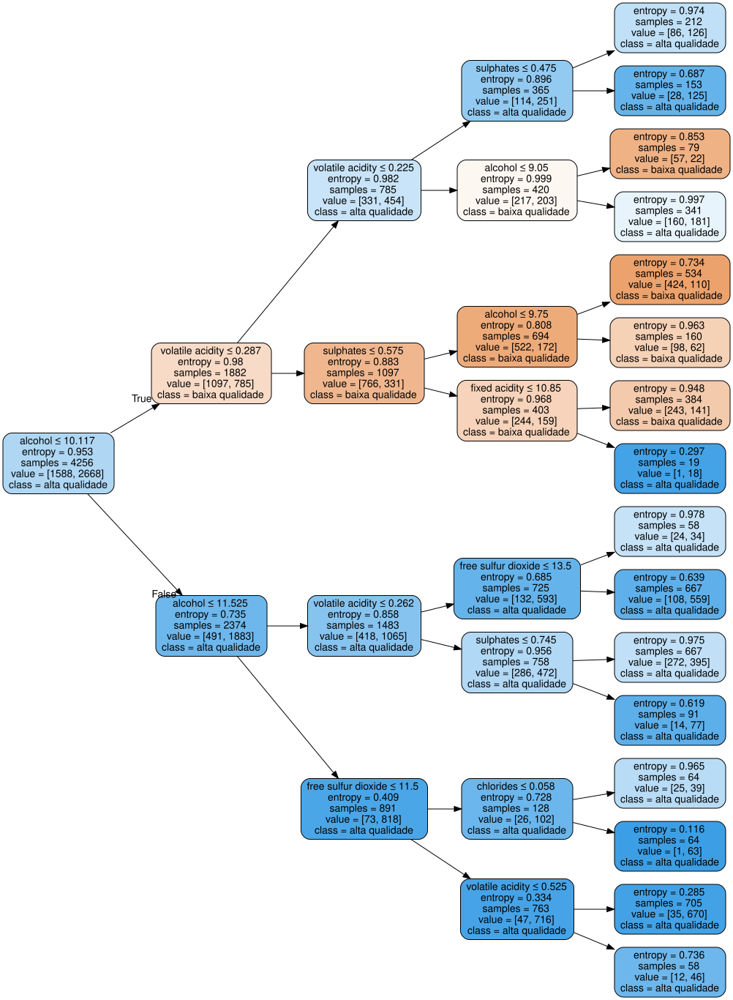

In [12]:
import graphviz
dot_data = tree.export_graphviz(model_wine, 
                  feature_names= wine_feature_names, 
                  leaves_parallel = True,
                  class_names=wine_label_map.target_label.values,  
                    filled=True, rounded=True,  
                  special_characters=True,
                                rotate=True,
                   out_file=None,
                           )
graph = graphviz.Source(dot_data)
# graph.format = "png"
# graph.render("./teste")
graph

### Distribuições 

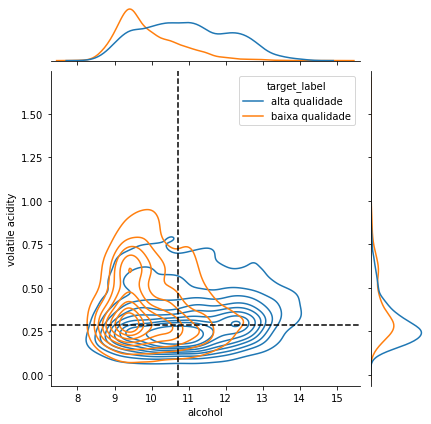

In [13]:
df = df_wine_tr.merge(wine_label_map, on='target')
ax = sns.jointplot(data=df, x='alcohol',y='volatile acidity',
              hue='target_label', kind='kde')

ax.ax_joint.axvline(x=10.725, linestyle='--', color='k')
ax.ax_joint.axhline(y=0.287, linestyle='--', color='k')


### Caminho da Árvore 

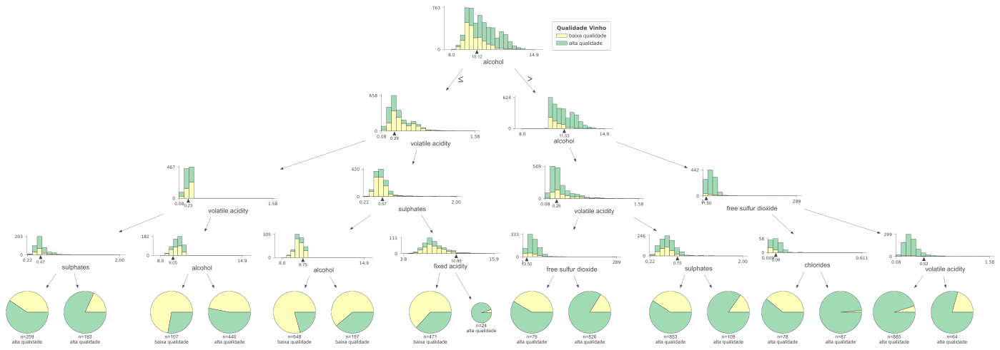

In [13]:
from dtreeviz.trees import dtreeviz # remember to load the package

viz = dtreeviz(model_wine, df_wine_tr[wine_feature_names],
               df_wine_tr[wine_target_col],
                target_name="Qualidade Vinho",
                feature_names=wine_feature_names,
                class_names=list(wine_label_map.target_label.values))

viz.save("./teste.svg")
viz

### Importância das Variáveis - Entropia

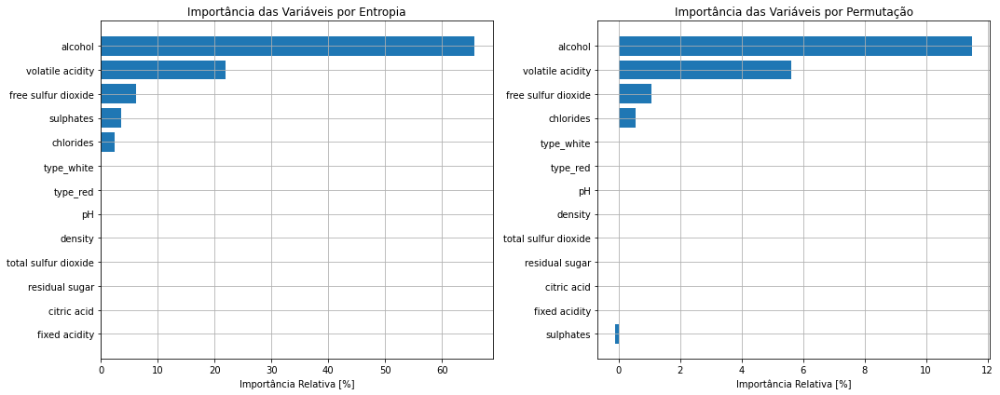

In [15]:
plt.figure(figsize=(15,6))


plt.subplot(1,2,1)
idx = np.argsort(model_wine.feature_importances_)

plt.barh(np.arange(idx.shape[0]), model_wine.feature_importances_[idx]*100)

plt.yticks(np.arange(idx.shape[0]), np.array(wine_feature_names)[idx])
plt.title('Importância das Variáveis por Entropia')
plt.grid()
plt.xlabel('Importância Relativa [%]')
plt.tight_layout()

plt.subplot(1,2,2)
r = permutation_importance(model_wine, xtest, ytest,
                           n_repeats=30,
                        random_state=0)
importance =  r.importances_mean
idx = np.argsort(importance)
plt.barh(np.arange(idx.shape[0]), importance[idx]*100)
plt.yticks(np.arange(idx.shape[0]), np.array(wine_feature_names)[idx])
plt.title('Importância das Variáveis por Permutação')
plt.grid()
plt.xlabel('Importância Relativa [%]')
plt.tight_layout()

## Íris 

In [16]:

Y = df_iris[iris_target_col]
X = df_iris.drop(iris_target_col, axis=1)
iris_feature_names = list(X.columns)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[iris_target_col] = ytrain
df_test[iris_target_col] = ytest


model_iris = tree.DecisionTreeClassifier(criterion='entropy', max_depth = 4)

model_iris.fit(xtrain, ytrain)      
df_train['decision_tr'] = model_iris.predict(xtrain)
df_test['decision_tr']  = model_iris.predict(xtest)
for icls in iris_label_map.target.unique():
    xclass = xtrain[ytrain==icls]
    idx = df_train[iris_target_col] == icls
    df_train.loc[idx,'probability_tr'] = model_iris.predict_proba(xclass)[:,icls]
    xclass = xtest[ytest==icls]
    idx = df_test[iris_target_col] == icls
    df_test.loc[idx,'probability_tr']  = model_iris.predict_proba(xclass)[:,icls]

df_iris_tr = pandas.concat((df_train, df_test), axis=0)

idx = df_iris_tr['train_set'] == 0

print('Decision Tree\t', metrics.accuracy_score(df_iris_tr[idx][iris_target_col],
                                                df_iris_tr[idx]['decision_tr']))

Decision Tree	 1.0


### Estrutura da Árvore 

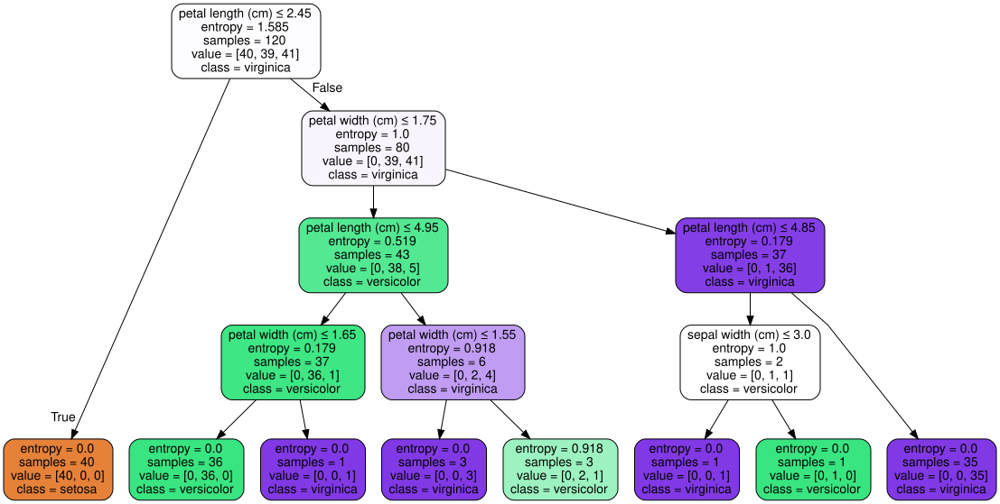

In [17]:
import graphviz
dot_data = tree.export_graphviz(model_iris, 
                  feature_names= iris_feature_names, 
                  leaves_parallel = True,
                  class_names=iris_label_map.target_label.values,  
                    filled=True, rounded=True,  
                  special_characters=True,
                                rotate=False,
                   out_file=None,
                           )
graph = graphviz.Source(dot_data)
graph.format = "png"
graph.render("./teste")
graph

### Caminho da Árvore 

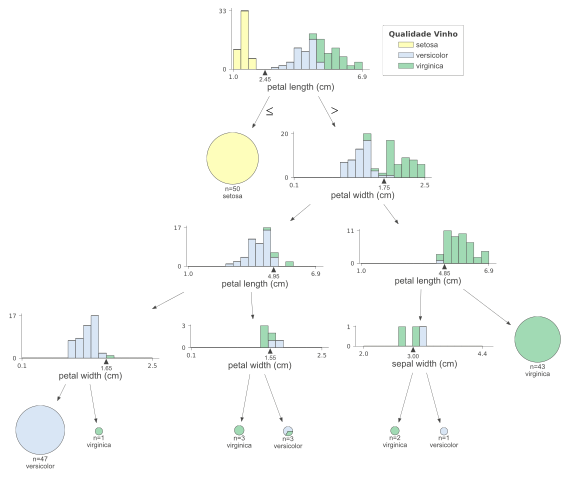

In [18]:
from dtreeviz.trees import dtreeviz # remember to load the package

viz = dtreeviz(model_iris, df_iris_tr[iris_feature_names],
               df_iris_tr[iris_target_col],
                target_name="Qualidade Vinho",
                feature_names=iris_feature_names,
                class_names=list(iris_label_map.target_label.values))

viz.save("./teste.svg")
viz

### Importância das Variáveis por Entropia 

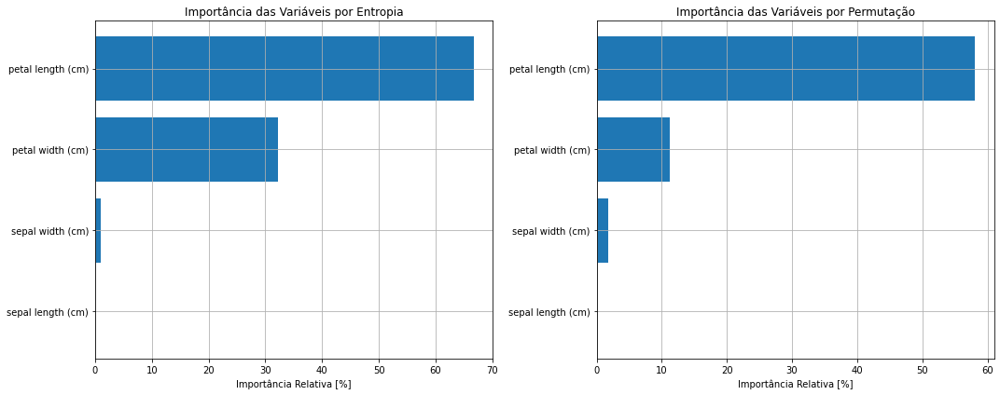

In [19]:
plt.figure(figsize=(15,6))


plt.subplot(1,2,1)
idx = np.argsort(model_iris.feature_importances_)

plt.barh(np.arange(idx.shape[0]), model_iris.feature_importances_[idx]*100)

plt.yticks(np.arange(idx.shape[0]), np.array(iris_feature_names)[idx])
plt.title('Importância das Variáveis por Entropia')
plt.grid()
plt.xlabel('Importância Relativa [%]')
plt.tight_layout()


plt.subplot(1,2,2)
r = permutation_importance(model_iris, xtest, ytest,
                           n_repeats=30,
                        random_state=0)
importance =  r.importances_mean
idx = np.argsort(importance)
plt.barh(np.arange(idx.shape[0]), importance[idx]*100)
plt.yticks(np.arange(idx.shape[0]), np.array(iris_feature_names)[idx])
plt.title('Importância das Variáveis por Permutação')
plt.grid()
plt.xlabel('Importância Relativa [%]')
plt.tight_layout()


# Regressao 

In [20]:
def print_regression_report(ytrue, ypred, dset):
    measurement_dict = {
        'mean_absolute_error': metrics.mean_absolute_error(ytrue, ypred),
        'mean_squared_error': metrics.mean_squared_error(ytrue, ypred),
        'root_mean_squared_error': np.sqrt(metrics.mean_squared_error(ytrue, ypred)),
        'median_absolute_error': metrics.median_absolute_error(ytrue, ypred),
        'r2': metrics.r2_score(ytrue, ypred),
        'mean_absolute_percentage_error': metrics.mean_absolute_percentage_error(ytrue, ypred),
    }
    df =  pandas.DataFrame.from_dict(measurement_dict, orient='index')
    df.columns=[dset]
    return df
   

# Regressao Linear 

## Clima 

In [21]:
df_weather = pandas.read_csv('../Data/dataset_clima.csv',sep=';')

drop_cols = ['Temperature (C)']
df_weather.drop(drop_cols, axis=1, inplace=True)

print(df_weather.shape)

weather_target_col = 'Apparent Temperature (C)'

df_weather.head()

(4019, 7)


,Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars)
0,-4.050,0.890,17.114,140.000,9.982,0.0,1016.660
1,-0.175,0.817,21.229,142.750,11.348,0.0,1011.985
2,1.809,0.847,17.825,164.583,8.492,0.0,1010.384
3,0.445,0.897,7.727,252.542,9.224,0.0,1021.171
4,-0.663,0.907,12.153,35.000,8.353,0.0,981.771


In [22]:

Y = df_weather[weather_target_col]
X = df_weather.drop(weather_target_col, axis=1)
weather_feature_names = list(X.columns)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[weather_target_col] = ytrain
df_test[weather_target_col] = ytest


model_weather = lm.Lasso()
model_weather.fit(xtrain, ytrain)      
df_train['prediction_lr'] = model_weather.predict(xtrain)
df_test['prediction_lr']  = model_weather.predict(xtest)

df_weather_lr = pandas.concat((df_train, df_test), axis=0)

idx = df_weather_lr['train_set'] == 0


print('Linear Regression Model')

print_regression_report(df_weather_lr[weather_target_col], 
                        df_weather_lr['prediction_lr'], 'auto')


Linear Regression Model


,auto
mean_absolute_error,6.215
mean_squared_error,58.850
root_mean_squared_error,7.671
median_absolute_error,5.541
r2,0.404
mean_absolute_percentage_error,3.009


### Coeficientes da Regressão 

In [23]:
interact(plot_coefs, model = fixed(model_weather), 
         class_label = fixed(''),
         target_label_map = fixed(None))

interactive(children=(Output(),), _dom_classes=('widget-interact',))

<function __main__.plot_coefs(model, class_label, target_label_map)>

### Parameters 

In [24]:
i=77
print('==== EXAMPLE ====')
X = df_weather_lr[weather_feature_names].iloc[i]
print(X)
print('Target:', weather_target_col,  df_weather_lr.iloc[i][weather_target_col].round(3))
print('==== PARAMETERS ====')
print(model_weather.coef_)
print(model_weather.intercept_)

Yhat = np.dot(model_weather.coef_, X.values) + model_weather.intercept_
print('Yhat:', Yhat)


==== EXAMPLE ====
Humidity                     0.503
Wind Speed (km/h)           14.699
Wind Bearing (degrees)     185.083
Visibility (km)             12.296
Loud Cover                   0.000
Pressure (millibars)      1009.048
Name: 919, dtype: float64
Target: Apparent Temperature (C) 25.86
==== PARAMETERS ====
[-0.    -0.58   0.004  1.777  0.    -0.007]
4.460202413351228
Yhat: 12.00639946122757


# Árvore Regressão 

## Automóveis 

In [26]:
df_auto = pandas.read_csv('../Data/dataset_auto.csv',sep=';')
df_auto['model'] = df_auto['brand'].astype(str) + df_auto['model'].astype(str)

auto_target_col = 'price'

drop_cols = ['brand','tax']
df_auto.drop(drop_cols, axis=1, inplace=True)
print(df_auto.shape)
df_auto.head()

(15000, 8)


,model,year,price,transmission,mileage,fuelType,mpg,engineSize
0,audi A1,2020,20000,Manual,5000,Petrol,49.6,1.0
1,audi A5,2017,19995,Semi-Auto,54000,Diesel,67.3,2.0
2,audi A3,2017,11895,Manual,28334,Petrol,62.8,1.0
3,audi Q7,2018,56900,Semi-Auto,5330,Diesel,39.2,4.0
4,audi A4,2019,27160,Semi-Auto,17790,Diesel,47.9,2.0


In [27]:
categorical_cols = ['transmission', 'fuelType', 'model']
encoder_map = {}

for cname in categorical_cols:
    encoder = preprocessing.OneHotEncoder(sparse=False)
    encoder = preprocessing.Ordina
    transformed = encoder.fit_transform(df_auto[[cname]])
    ohe_df = pandas.DataFrame(transformed, columns=[cname+'_'+cat for cat in encoder.categories_[0]])
    encoder_map[cname] = encoder
    
    df_auto = pandas.concat([df_auto, ohe_df], axis=1).drop(cname, axis=1)
df_auto.head()

,year,price,mileage,mpg,engineSize,transmission_Automatic,transmission_Manual,transmission_Semi-Auto,fuelType_Diesel,fuelType_Electric,...,model_ford Ka+,model_ford Kuga,model_ford Mondeo,model_ford Mustang,model_ford Puma,model_ford S-MAX,model_ford Streetka,model_ford Tourneo Connect,model_ford Tourneo Custom,model_ford Transit Tourneo
0,2020,20000,5000,49.6,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2017,19995,54000,67.3,2.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2017,11895,28334,62.8,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2018,56900,5330,39.2,4.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2019,27160,17790,47.9,2.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:

Y = df_auto[auto_target_col]
X = df_auto.drop(auto_target_col, axis=1)
auto_feature_names = list(X.columns)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[auto_target_col] = ytrain
df_test[auto_target_col] = ytest


model_auto = tree.DecisionTreeRegressor(criterion='mse', max_depth = 10)
model_auto.fit(xtrain, ytrain)      
df_train['prediction_tr'] = model_auto.predict(xtrain)
df_test['prediction_tr']  = model_auto.predict(xtest)

df_auto_tr = pandas.concat((df_train, df_test), axis=0)


idx = df_auto_tr['train_set'] == 0

print('Decision Tree')

print_regression_report(df_auto_tr[auto_target_col], df_auto_tr['prediction_tr'], 'auto')


Decision Tree


,auto
mean_absolute_error,1.839e+03
mean_squared_error,7.326e+06
root_mean_squared_error,2.707e+03
median_absolute_error,1.295e+03
r2,9.399e-01
mean_absolute_percentage_error,1.072e-01


### Estrutura Árvore 

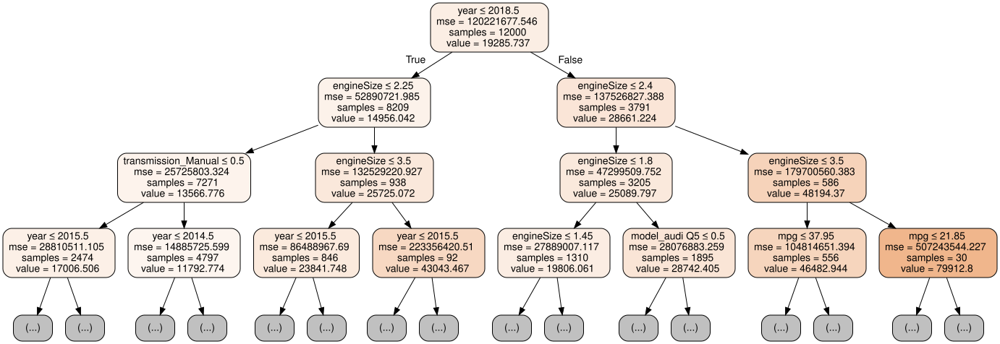

In [29]:
import graphviz
dot_data = tree.export_graphviz(model_auto, 
                  feature_names= auto_feature_names, 
                  leaves_parallel = True, 
                    filled=True, rounded=True,  
                  special_characters=True,
                                rotate=False,
                   out_file=None,
                    max_depth=3
                           )
graph = graphviz.Source(dot_data)
graph.format = "png"
graph.render("./teste")
graph

### Caminhos da Árvore 

In [30]:

viz = dtreeviz(model_auto, df_auto_tr[auto_feature_names],
               df_auto_tr[auto_target_col],
                target_name='Preço Automóvel',
                feature_names=auto_feature_names,
               depth_range_to_display=[0, 2])

viz.save("./teste.svg")
viz

## Clima 

In [31]:

Y = df_weather[weather_target_col]
X = df_weather.drop(weather_target_col, axis=1)
weather_feature_names = list(X.columns)

# train/test
xtrain, xtest, ytrain, ytest = model_selection.train_test_split(X, Y, test_size=0.2)

df_train = xtrain.copy()
df_test = xtest.copy()
df_train['train_set'] = 1
df_test['train_set'] = 0
df_train[weather_target_col] = ytrain
df_test[weather_target_col] = ytest

model_weather = tree.DecisionTreeRegressor(criterion='mse', max_depth = 5)
model_weather.fit(xtrain, ytrain)      
df_train['prediction_tr'] = model_weather.predict(xtrain)
df_test['prediction_tr']  = model_weather.predict(xtest)

df_weather_tr = pandas.concat((df_train, df_test), axis=0)


idx = df_weather_tr['train_set'] == 0

print('Decision Tree')

print_regression_report(df_weather_tr[weather_target_col],
                        df_weather_tr['prediction_tr'], 'auto')


Decision Tree


,auto
mean_absolute_error,5.048
mean_squared_error,41.228
root_mean_squared_error,6.421
median_absolute_error,4.230
r2,0.583
mean_absolute_percentage_error,2.404


### Estrutura da Árvore 

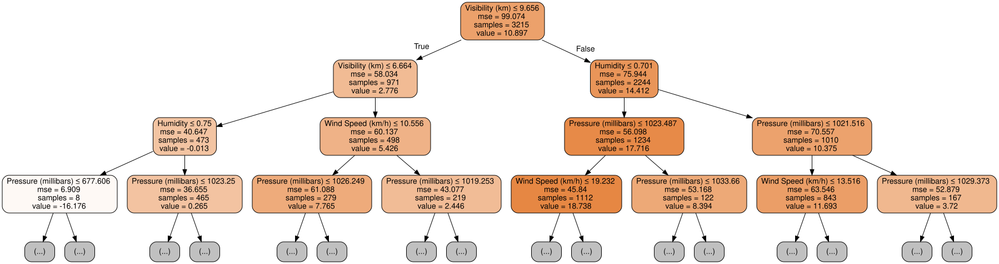

In [32]:

dot_data = tree.export_graphviz(model_weather, 
                  feature_names= weather_feature_names, 
                  leaves_parallel = True, 
                    filled=True, rounded=True,  
                  special_characters=True,
                                rotate=False,
                   out_file=None,
                    max_depth=3
                           )
graph = graphviz.Source(dot_data)
graph.format = "png"
graph.render("./teste")
graph

### Caminhos da Árvore 

In [33]:

viz = dtreeviz(model_weather, df_weather_tr[weather_feature_names],
               df_weather_tr[weather_target_col],
                target_name=weather_target_col,
                feature_names=weather_feature_names,
               depth_range_to_display=[0, 3])

viz.save("./teste.svg")
viz

### Importância das Variáveis 

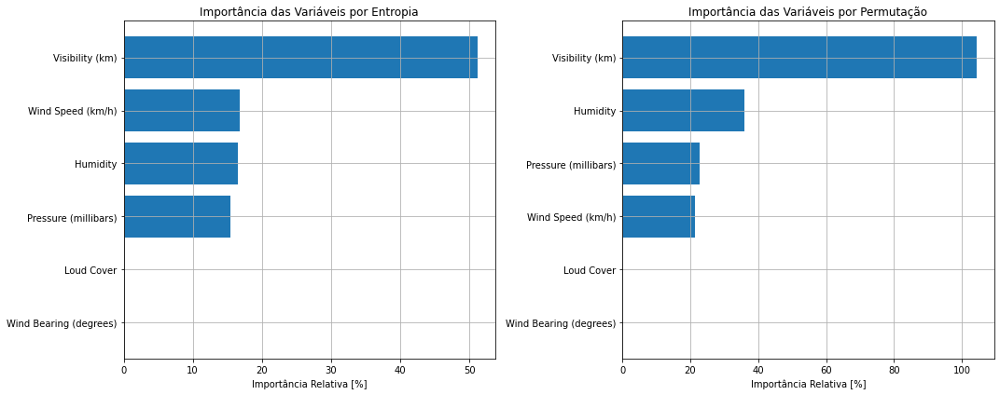

In [34]:
plt.figure(figsize=(15,6))


plt.subplot(1,2,1)
idx = np.argsort(model_weather.feature_importances_)

plt.barh(np.arange(idx.shape[0]), model_weather.feature_importances_[idx]*100)

plt.yticks(np.arange(idx.shape[0]), np.array(weather_feature_names)[idx])
plt.title('Importância das Variáveis por Entropia')
plt.grid()
plt.xlabel('Importância Relativa [%]')
plt.tight_layout()


plt.subplot(1,2,2)
r = permutation_importance(model_weather, xtest, ytest,
                           n_repeats=30,
                        random_state=0)
importance =  r.importances_mean
idx = np.argsort(importance)
plt.barh(np.arange(idx.shape[0]), importance[idx]*100)
plt.yticks(np.arange(idx.shape[0]), np.array(weather_feature_names)[idx])
plt.title('Importância das Variáveis por Permutação')
plt.grid()
plt.xlabel('Importância Relativa [%]')
plt.tight_layout()
